In [330]:
import numpy as np
import pandas as pd
import re

import matplotlib
import matplotlib.pyplot as plt 
import matplotlib.mlab as mlab
%matplotlib inline
import seaborn as sns
# отключим предупреждения Anaconda
import warnings
warnings.simplefilter('ignore')
#графики в svg выглядят более четкими
%config InlineBackend.figure_format = 'svg' 

#увеличим дефолтный размер графиков
from pylab import rcParams
rcParams['figure.figsize'] = 4, 2
sns.set()

from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
init_notebook_mode()
import plotly.graph_objs as go

In [2]:
Years = range(1880, 2011)

pieces = []
columns =['Name', 'Sex', 'Births']

for year in Years:

    path = r'babynames/yob%d.txt' % year
    df = pd.read_csv(path, names=columns)
    df['Year'] = year
    pieces.append(df)


#Собрать все данные в один объект DataFrame

Data = pd.concat(pieces, ignore_index=True)

## Вопрос 4:
●	Для каждого года рассчитайте сколько имен покрывают 50% людей, визуализируйте (мы увидим разнообразие имен за каждый год)

In [3]:
df = Data[Data['Year'] == 2000]

In [4]:
# Создаю новый признак процентное отношение к общему числу родившихся
df['Prop'] = (df['Births'] / df['Births'].sum()) *100

In [5]:
df =df.sort_values(by='Prop',ascending=False)

In [6]:
# Новый признак сумма пропорций
df['Sum_prop'] = df['Prop'].cumsum()

In [7]:
x = df['Sum_prop'].searchsorted(50)[0]+1

### Итак теперь нужно объеденить 50% имен по всем годам

In [3]:
Data_top_50 = pd.DataFrame()

for year in range(1880,2011):
    data = Data[Data['Year'] == year]
    
    # Создаю новый признак процентное отношение к общему числу родившихся
    
    data['Prop'] = (data['Births'] / data['Births'].sum()) *100
    data =data.sort_values(by='Prop',ascending=False)
    
    # Новый признак сумма пропорций
    
    data['Sum_prop'] = data['Prop'].cumsum()
    x = data['Sum_prop'].searchsorted(50)[0]+1
   
    Data_top_50 = Data_top_50.append(data[:x])

In [4]:
Data_top_50.drop(['Prop','Sum_prop'],axis=1,inplace=True)

In [17]:
df1880 = Data_top_50[Data_top_50['Year']== 1880]
df1890 = Data_top_50[Data_top_50['Year']== 1890]
df1900 = Data_top_50[Data_top_50['Year']== 1900]
df1880_pivot = df1880.pivot_table('Births',index='Year',columns='Name')

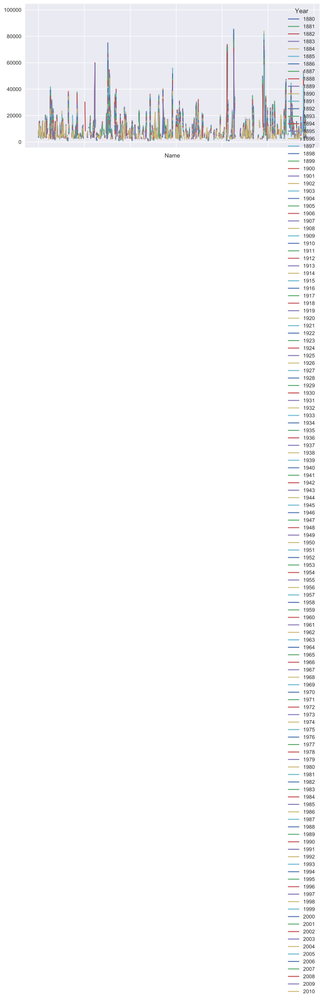

In [67]:
Data_top_50.pivot_table('Births', index = "Name", columns = 'Year', aggfunc = sum).plot(figsize = (10, 5))

In [71]:
Data_top_50_pivot = Data_top_50.pivot_table('Births', index = "Name", columns = 'Year', aggfunc = sum);

In [72]:
trace = go.Heatmap(
    z=Data_top_50_pivot.as_matrix(), 
    x=Data_top_50_pivot.columns, 
    y=Data_top_50_pivot.index, 
    colorscale='Blues', 
    opacity=0.8,
)
data=[trace]
iplot(data, filename='basic-heatmap')

In [79]:
# Создаю новый признак по которому можно будет отгрупировать данные
Data['Year_10'] = Data['Year'].apply(lambda x: 0 if x <= 1893 else
                                               1 if x <= 1906 else
                                               2 if x <= 1919 else
                                               3 if x <= 1932 else
                                               4 if x <= 1945 else
                                               5 if x <= 1958 else
                                               6 if x <= 1971 else
                                               7 if x <= 1984 else
                                               8 if x <= 1997 else
                                               9 )

In [80]:
List_M = []
for year_10 in range(0,10):
    List_M.append(Data[(Data['Sex'] == 'M') &(Data['Year_10'] == year_10)].groupby('Name')['Births'].sum().argmax())

In [81]:
List_F = []
for year_10 in range(0,10):
    List_F.append(Data[(Data['Sex'] == 'F') &(Data['Year_10'] == year_10)].groupby('Name')['Births'].sum().argmax())

In [83]:
# Так как нам здесь не интересно имена по периодам то удаляем дубликаты
Set_M = set(List_M)
Set_F = set(List_F)
Set_All_Name = set()
Set_All_Name = Set_All_Name.union(Set_M,Set_F)


In [77]:
Data_john = Data[Data['Name'] == 'John'].groupby('Year', as_index = False)['Births'].sum()
Data_lisa = Data[Data['Name'] == 'Lisa'].groupby('Year', as_index = False)['Births'].sum()

In [78]:
trace = go.Scatter(
            x = Data_john['Year'],
            y = Data_john['Births'],
            name = 'John',
            mode = 'lines')

trace1 = go.Scatter(
            x = Data_lisa['Year'],
            y = Data_lisa['Births'],
            name = 'Lisa',
            mode = 'lines')



data_plotly = [trace, trace1]   
layout = {'title': 'Name'}

fig = go.Figure(data = data_plotly, layout=layout)

iplot(fig, show_link=False)   

In [86]:
Data_top_50.head()

,Name,Sex,Births,Year
942,John,M,9655,1880
943,William,M,9533,1880
0,Mary,F,7065,1880
944,James,M,5927,1880
945,Charles,M,5348,1880


In [94]:
df_name_50 = Data_top_50[Data_top_50['Year'] == 1880].groupby('Name', as_index = False)['Births'].sum()

In [103]:
Data_top_10 = pd.DataFrame()
for name in Set_All_Name:
    
    Data_top_10[name] =  Data[Data['Name'] == name].groupby('Year')['Births'].sum()

In [131]:

data_plotly = [{ 'x': Data_top_10[name].index,
                 'y': Data_top_10[name],
                  'mode' : 'lines',
                  'name' : name
                } for name in Set_All_Name]  

layout = {'title': "All_name"}

fig = go.Figure(data = data_plotly, layout=layout)

iplot(fig, show_link=False) 

### Bar

In [158]:
data_plotly = [{ 'x': Data_top_10[name].index,
                 'y': Data_top_10[name],
                  'type' : 'bar',
                  'name' : name
                } for name in Set_All_Name]  

layout = {'title': "All_name",
          'barmode': 'stack'}

fig = go.Figure(data = data_plotly, layout=layout)

iplot(fig, show_link=False) 

In [112]:
data_plotly = [
                { 'x': Data_top_10[name].index,
                 'y': Data_top_10[name],
                  'mode' : 'lines',
                  'name' : name
                } for name in Set_All_Name] 

In [113]:
data_plotly 

[{'mode': 'lines',
  'name': 'Linda',
  'x': Int64Index([1880, 1881, 1882, 1883, 1884, 1885, 1886, 1887, 1888, 1889,
              ...
              2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010],
             dtype='int64', name='Year', length=131),
  'y': Year
  1880      27
  1881      38
  1882      36
  1883      49
  1884      33
  1885      60
  1886      49
  1887      50
  1888      77
  1889      74
  1890      54
  1891      78
  1892      83
  1893      83
  1894      94
  1895      96
  1896     104
  1897      81
  1898     102
  1899      98
  1900     127
  1901      86
  1902      91
  1903      90
  1904     101
  1905     107
  1906      98
  1907     102
  1908      93
  1909     105
          ... 
  1981    2744
  1982    2804
  1983    2496
  1984    2345
  1985    2121
  1986    1970
  1987    1945
  1988    1854
  1989    1859
  1990    1671
  1991    1616
  1992    1591
  1993    1493
  1994    1290
  1995    1232
  1996     982
  1997    1092
  19

## Генератор словаря

In [ ]:
{ d['id']:d for d in data }.values()

In [ ]:
df_name_50 = Data_top_50[Data_top_50['Year'] == year].groupby('Name', as_index = False)['Births'].sum()
data = [ 
        { 'x' : df_name_50['Name'],
          'y' : df_name_50['Births'],
          'name' : year,
          'type' : 'bar'
        } for year in range(1880,2011)]

layout = {'title': "All_name",
              "barmode":'stack'}


fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='stacked-bar')

In [134]:
John = Data_top_50[Data_top_50['Name'] == 'John']

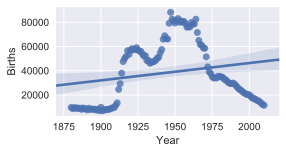

In [139]:
sns.regplot(x='Year', y='Births', data=John); plt.show()

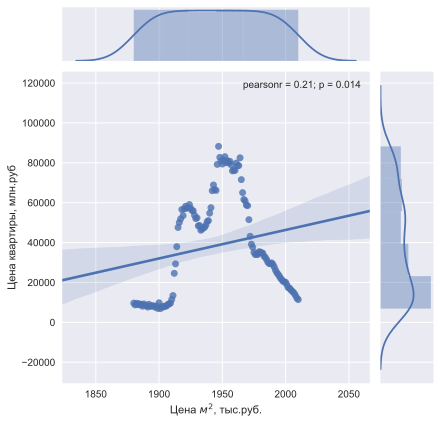

In [140]:
# нарисуем ещё и линию тренда kind='reg'
sns.jointplot(x='Year', y='Births', data=John, kind='reg');
# подпишем оси координат
plt.xlabel("Цена $м^2$, тыс.руб.");
plt.ylabel("Цена квартиры, млн.руб");
plt.show();

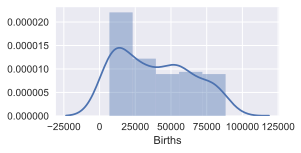

In [144]:
sns.distplot(John['Births']);  # подготовим гистограмму и кривую распределения


Text(0.5,0.98,'Характеристики распределения цен за $м^2$')

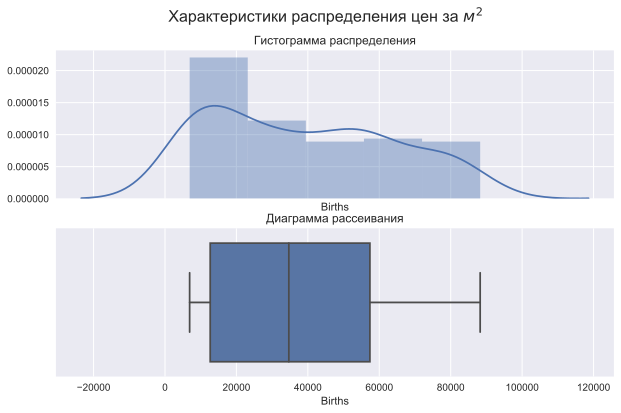

In [149]:
# расположим графики по 2 в столбце в 1 столбец
# и пусть графики имеют общую ось Х

f, ax = plt.subplots(2,1, sharex=True,figsize = (10,6))

ax[0].set_title("Гистограмма распределения")
ax[1].set_title('Диаграмма рассеивания')

# а также ось абсцисс. 
# она будет расположена в низу нижнего графика, поэтому добавим подпись только туда

ax[1].set_xlabel('тыс.руб.')

# явно укажем в параметре ax в каком месте какой график изображать

sns.boxplot(John['Births'], ax=ax[1])
sns.distplot(John['Births'], ax=ax[0])

# озаглавим всю картинку, а чтобы текст не сливался с остальными подписями сделаем его шрифтом покрупнее

plt.suptitle("Характеристики распределения цен за $м^2$", size=16)

In [160]:
Data_count = Data_top_50.groupby('Year',as_index = False)['Name'].count()

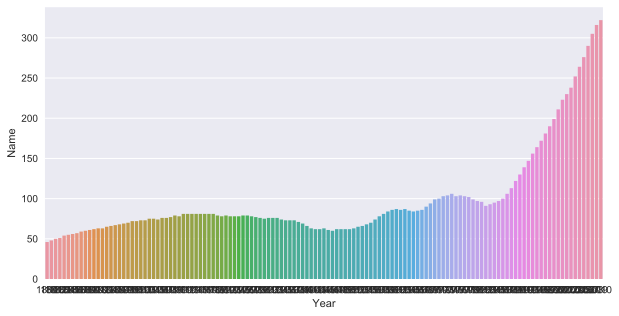

In [164]:
# Set up the matplotlib figure
fig, ax1 = plt.subplots(1,1, figsize = (10,5), sharey=False)

sns.barplot(x = 'Year', y ='Name', data = Data_count, ax=ax1);

In [13]:
Data_top_group = Data_top_50.pivot_table('Births', index = 'Name',columns = 'Year', aggfunc = sum)
Data_top_group;

In [14]:
# Normalize data columns
Data_top_group_norm = (Data_top_group - Data_top_group.mean()) / (Data_top_group.max() - Data_top_group.min())

In [ ]:
trace0 = go.Scatter(
    x=x,
    y=y,
    mode='markers',
    marker=dict(
        size=area,
        sizemode='area',
        sizemin=4,
        color=colours
    ),
    text=text
)

data = [trace0]
iplot(data, filename='bubblechart-size-ref')

## Heat_map

In [84]:
trace = go.Heatmap(
    z=Data_top_group_norm.as_matrix(), 
    x=Data_top_group_norm.columns,
    y=Data_top_group_norm.index, 
    colorscale='Blues', 
    opacity=1,
)
data=[trace]
iplot(data, filename='basic-heatmap')

## Пузырики

In [155]:
# trace0 = go.Scatter(
#     x=John['Year'],
#     y=John['Births'],
#     mode='markers',
#     marker=dict(
#         size=John['Births'] / 100,
#         sizemode='area',
#         sizemin=4,
        
#     )
# )
data_plotly = [
                { 'x': Data_top_10[name].index,
                  'y': Data_top_10[name],
                  'mode' : 'markers',
                  'name' : name,
                  "marker": dict(
                     size=John['Births'] / 100,
                     sizemode='area',
                     sizemin=4,)
                } for name in Set_All_Name]

data = data_plotly
iplot(data, filename='bubblechart-size-ref')

In [8]:
Data_2000 = df[:x]
Data_2000.head()

,Name,Sex,Births,Year,Prop,Sum_prop
1349821,Jacob,M,34454,2000,0.912529,0.912529
1349822,Michael,M,32016,2000,0.847957,1.760486
1349823,Matthew,M,28563,2000,0.756503,2.516989
1349824,Joshua,M,27522,2000,0.728932,3.245921
1332172,Emily,F,25949,2000,0.687270,3.933191


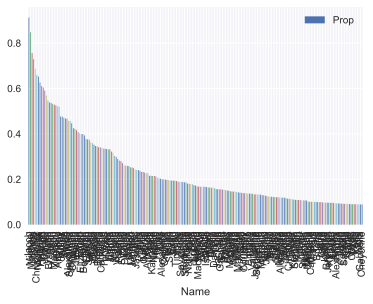

In [33]:
Data_2000.plot.bar(x='Name', y='Prop');

### Нужно как то визуализировать это безобразие!


In [35]:
data_2000_heatmap = Data_2000.pivot_table('Births',index = 'Name',columns='Year')

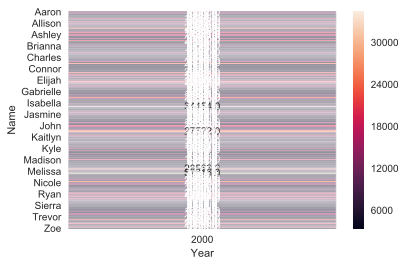

In [37]:
sns.heatmap(data_2000_heatmap, annot=True, fmt=".1f", linewidths=.5);

In [10]:
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
init_notebook_mode()
import plotly.graph_objs as go

## Bar plot

In [17]:
years_data = Data.groupby('Year')[['Births']].sum().join(
    Data.groupby('Year')[['Sex']].count())

In [19]:
years_data.head()

,Births,Sex
Year,,
1880,201486,2000
1881,192703,1935
1882,221538,2127
1883,216954,2084
1884,243466,2297


In [20]:
years_data.columns = ['Рождение', 'Полл']

In [11]:
trace0 = go.Scatter(
    x=years_data.index,
    y=years_data['Рождение'],
    name='Рождение'
)

trace1 = go.Scatter(
    x=years_data.index,
    y=years_data['Полл'],
    name='Полл'
)
data_plotly = [trace0, trace1]
layout = {'title': 'Statistics of video games'}

fig = go.Figure(data=data_plotly, layout=layout)

iplot(fig, show_link=False)

NameError: name 'years_data' is not defined

In [9]:
Data_Sex_F = Data[Data['Sex'] == 'F'].groupby('Year',as_index = False)['Births'].sum()
Data_Sex_F.columns = ['Год','Девочки']

In [10]:
Data_Sex_M = Data[Data['Sex'] == 'M'].groupby('Year',as_index = False)['Births'].sum()
Data_Sex_M.columns = ['Год','Мальчики']

In [156]:
trace_F = go.Scatter(
            x = Data_Sex_F.Год,
            y = Data_Sex_F.Девочки,
            name = 'Девочки'
            
)
trace_M = go.Scatter(
            x = Data_Sex_M.Год,
            y = Data_Sex_M.Мальчики,
            name = 'Мальчики'
            
)

data_plot = [trace_F,trace_M]
layout = {'title': 'Рождение мальчиков и девочек по годам'}
fig = go.Figure(data=data_plot, layout=layout)
iplot(fig, show_link=False)

NameError: name 'Data_Sex_F' is not defined

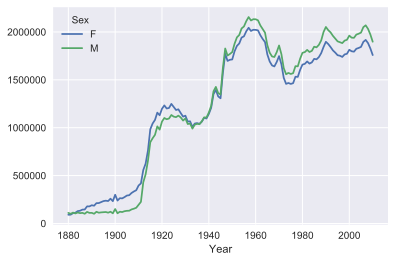

In [22]:
Data.pivot_table('Births', index='Year',columns = 'Sex',aggfunc=sum).plot()

In [ ]:
x = np.array(df['murder'])
y = np.array(df['burglary'])
area = np.array(df['population']) / 30000
colours = np.array(df['Robbery'])
text = np.array(df['state'])

In [ ]:
trace0 = go.Scatter(
    x=x,
    y=y,
    mode='markers',
    marker=dict(
        size=area,
        sizemode='area',
        sizemin=4,
        color=colours
    ),
    text=text
)

data = [trace0]
iplot(data, filename='bubblechart-size-ref')

### Строю пузырьки

In [ ]:
trace = go.Scatter{
    x = 
    
}

In [29]:
Data_Heatmap = Data_2000.pivot_table('Births', index = 'Year',columns='Name',aggfunc = sum)

In [35]:
Data_Heatmap

Name,Aaron,Abigail,Adam,Adrian,Alejandro,Alex,Alexa,Alexander,Alexandra,Alexandria,...,Tristan,Tyler,Vanessa,Victor,Victoria,William,Wyatt,Xavier,Zachary,Zoe
Year,,,,,,,,,,,,,,,,,,,,,
2000,9548,13085,8128,5333,4507,6741,3674,17275,7546,3547,...,3530,21497,5131,4047,10920,20643,3410,3637,19845,3783


In [39]:
Data_Heatmap.columns

Index(['Aaron', 'Abigail', 'Adam', 'Adrian', 'Alejandro', 'Alex', 'Alexa',
       'Alexander', 'Alexandra', 'Alexandria',
       ...
       'Tristan', 'Tyler', 'Vanessa', 'Victor', 'Victoria', 'William', 'Wyatt',
       'Xavier', 'Zachary', 'Zoe'],
      dtype='object', name='Name', length=210)

In [40]:
trace = go.Heatmap(
    z=Data_Heatmap.as_matrix(), 
    x=Data_Heatmap.columns,
    y=Data_Heatmap.index, 
    colorscale='Blues', 
    opacity=0.8,
)
data=[trace]
iplot(data, filename='basic-heatmap')

In [70]:
df1880 = Data[Data['Year'] == 1880]
df1890 = Data[Data['Year'] == 1890]
df1880.info()
df1890.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2000 entries, 0 to 1999
Data columns (total 4 columns):
Name      2000 non-null object
Sex       2000 non-null object
Births    2000 non-null int64
Year      2000 non-null int64
dtypes: int64(2), object(2)
memory usage: 78.1+ KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 2695 entries, 22743 to 25437
Data columns (total 4 columns):
Name      2695 non-null object
Sex       2695 non-null object
Births    2695 non-null int64
Year      2695 non-null int64
dtypes: int64(2), object(2)
memory usage: 105.3+ KB


In [38]:
trace0 = go.Scatter(
    x=x,
    y=y,
    mode='markers',
    marker=dict(
        size=area,
        sizemode='area',
        sizemin=4,
        color=colours
    ),
    text=text
)

data = [trace0]
iplot(Data_2000, filename='bubblechart-size-ref')

NameError: name 'go' is not defined

In [21]:
Data_50_Name = pd.DataFrame()

for year in range(1880,2011):
    

In [22]:
Data_50_Name = pd.DataFrame()

In [25]:
Data_50_Name.join(Data_2000)

,Name,Sex,Births,Year,Prop,Sum_prop


## Вопрос 5:
Выберите 4 года из всего промежутка и отобразите для каждого года распределение по первой букве в имени, по последней букве в имени


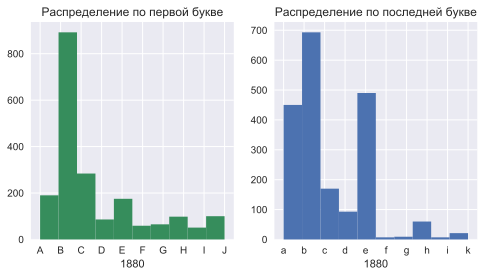

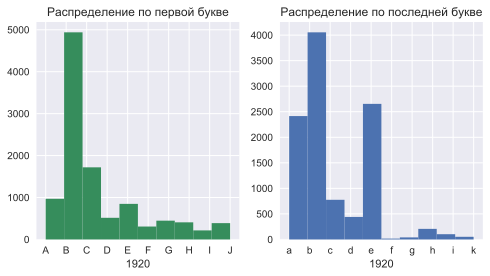

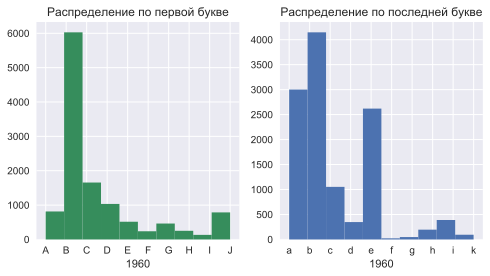

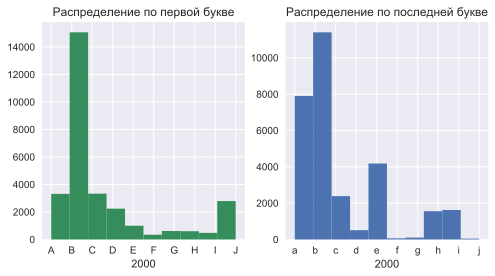

In [320]:

list_year = [1880,1920,1960,2000]

for year in list_year:
    
    fig, ax = plt.subplots(1,2, figsize = (8,4))
    
    ax[0].set_title("Распределение по первой букве")
    ax[1].set_title('Распределение по последней букве')

    ax[0].set_xlabel(str(year))
    ax[1].set_xlabel(str(year))
        
    Data[Data['Year'] == year].groupby('Year')['Name'].apply(
                                               lambda x : x).apply(lambda x : x[0]).hist(color = '#368d5c',ax = ax[0]);
    Data[Data['Year'] == year].groupby('Year')['Name'].apply(
                                               lambda x : x).apply(lambda x : x[-1]).hist(ax = ax[1]); 
    
  
    
    

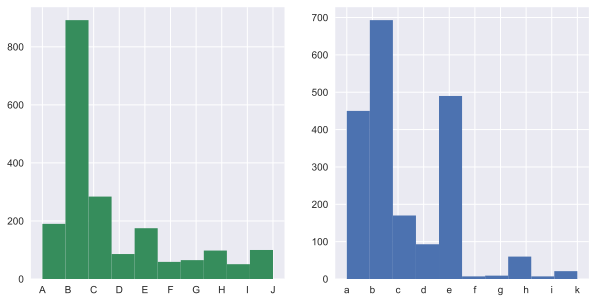

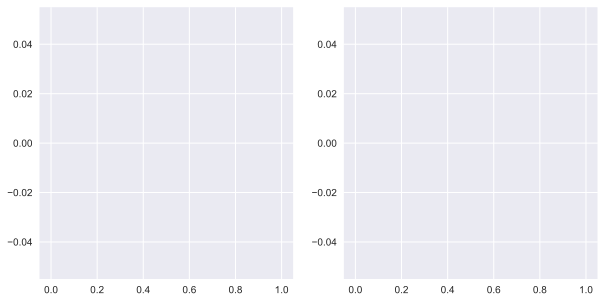

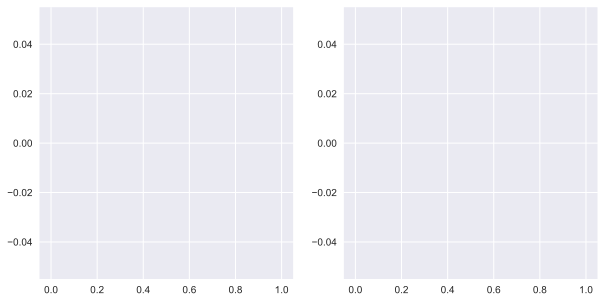

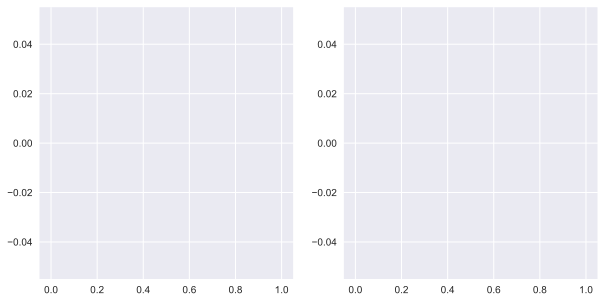

In [317]:
Data_first_Last = pd.DataFrame()
list_year = [1880,1920,1960,2000]
for year in list_year:
    Data_first_Last['First_Symbol'] = Data[Data['Year'] == year].groupby('Year')['Name'].apply(
                                               lambda x : x).apply(lambda x : x[0])
    Data_first_Last['Last_Symbol'] = Data[Data['Year'] == year].groupby('Year')['Name'].apply(
                                               lambda x : x).apply(lambda x : x[-1])
    
    fig, ax = plt.subplots(1,2, figsize = (10,5))
    
    Data_first_Last['First_Symbol'].hist(color = '#368d5c',ax = ax[0]); 
    Data_first_Last['Last_Symbol'].hist(ax = ax[1]); 

In [312]:
Data_first_Last.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2000 entries, 0 to 1999
Data columns (total 8 columns):
First_Symbol1880    2000 non-null object
Last_Symbol1880     2000 non-null object
First_Symbol1920    0 non-null object
Last_Symbol1920     0 non-null object
First_Symbol1960    0 non-null object
Last_Symbol1960     0 non-null object
First_Symbol2000    0 non-null object
Last_Symbol2000     0 non-null object
dtypes: object(8)
memory usage: 140.6+ KB


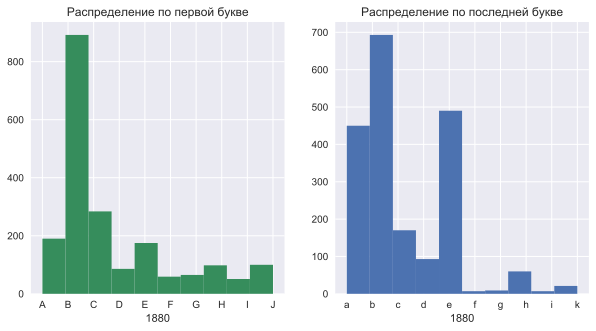

In [286]:
fig, ax = plt.subplots(1,2, figsize = (10,5))

ax[0].set_title("Распределение по первой букве")
ax[1].set_title('Распределение по последней букве')

ax[0].set_xlabel('1880')
ax[1].set_xlabel('1880')

Data1880['First_Symbol'].hist(ax=ax[0],color = '#368d5c'); 
Data1880['Last_Symbol'].hist(ax=ax[1]); 


## Вопрос 6:
Составьте список из нескольких известных людей (президенты, певцы, актеры, киногерои) и оцените их влияние на динамику имен, постройте наглядную визуализацию

In [344]:
List_Star = ['Tom Cruze','Will Smith', 'John Travolta', 'Monica Beluchi', 'Jessica Alba', 'Jennifer Aniston']
List_Name = [star.split(' ')[0] for star in List_Star]

In [345]:
List_Name

['Tom', 'Will', 'John', 'Monica', 'Jessica', 'Jennifer']

In [346]:
Data_top_star = pd.DataFrame()
for name in List_Name:
    
    Data_top_star[name] =  Data[Data['Name'] == name].groupby('Year')['Births'].sum()

In [347]:
data_plotly = [{ 'x': Data_top_star[name].index,
                 'y': Data_top_star[name],
                  'mode' : 'lines',
                  'name' : name
                } for name in List_Name]  

layout = {'title': "All_name"}

fig = go.Figure(data = data_plotly, layout=layout)

iplot(fig, show_link=False) 

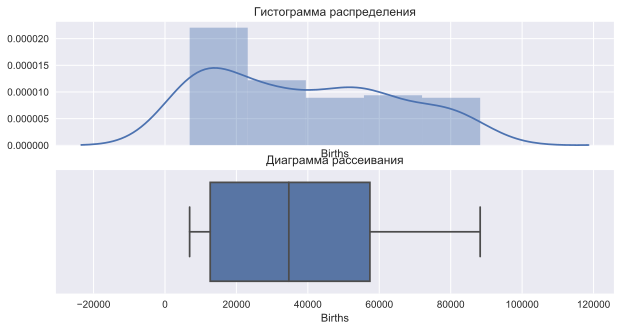

In [216]:
f, ax = plt.subplots(2,1, sharex=True,figsize = (10,5))

ax[0].set_title("Гистограмма распределения")
ax[1].set_title('Диаграмма рассеивания')

# а также ось абсцисс. 
# она будет расположена в низу нижнего графика, поэтому добавим подпись только туда

ax[1].set_xlabel('тыс.руб.')

# явно укажем в параметре ax в каком месте какой график изображать

sns.boxplot(John['Births'], ax=ax[1])
sns.distplot(John['Births'], ax=ax[0])

In [191]:
Name = ['LLLO','KKKK','asdasd']


In [200]:
First_Word = []
for Word in Name:
    First_Word.append(Word[-2:])
    
    
    

In [201]:
First_Word

['LO', 'KK', 'sd']

In [187]:
Name.title()

'Lllo'